# Generative A.I

# **Denoising Diffusion Probabilistic Models (DDPM)**

Reference
https://wandb.ai/capecape/train_sd/reports/How-To-Train-a-Conditional-Diffusion-Model-From-Scratch--VmlldzoyNzIzNTQ1

Paper
https://arxiv.org/pdf/2006.11239.pdf

Explanation
https://www.youtube.com/watch?v=HoKDTa5jHvg&ab_channel=Outlier

Implementation
https://www.youtube.com/watch?v=TBCRlnwJtZU&t=76s&ab_channel=Outlier

Code
https://github.com/dome272/Diffusion-Models-pytorch

# Testing Local Machine Specs

In [ ]:
!python --version
!nvidia-smi

Python 3.10.12
Mon Aug 28 17:43:17 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.103                Driver Version: 537.13       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 Ti     On  | 00000000:09:00.0  On |                  N/A |
| 57%   58C    P0             117W / 350W |   2087MiB / 12288MiB |      6%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------

In [ ]:
!ls

models	output_image.png  Pattern  results  runs  sample_data  Test


In [ ]:
!unzip Pattern.zip -d /content/

Archive:  Pattern.zip
   creating: /content/Pattern/
   creating: /content/Pattern/Architecture/
  inflating: /content/Pattern/Architecture/ARCHI1.jpg  
  inflating: /content/Pattern/Architecture/ARCHI10.jpg  
  inflating: /content/Pattern/Architecture/ARCHI11.jpg  
  inflating: /content/Pattern/Architecture/ARCHI12.jpg  
  inflating: /content/Pattern/Architecture/ARCHI13.jpg  
  inflating: /content/Pattern/Architecture/ARCHI14.jpg  
  inflating: /content/Pattern/Architecture/ARCHI15.jpg  
  inflating: /content/Pattern/Architecture/ARCHI2.jpg  
  inflating: /content/Pattern/Architecture/ARCHI3.jpg  
  inflating: /content/Pattern/Architecture/ARCHI4.jpg  
  inflating: /content/Pattern/Architecture/ARCHI5.jpg  
  inflating: /content/Pattern/Architecture/ARCHI6.jpg  
  inflating: /content/Pattern/Architecture/ARCHI7.jpg  
  inflating: /content/Pattern/Architecture/ARCHI8.jpg  
  inflating: /content/Pattern/Architecture/ARCHI9.jpg  
   creating: /content/Pattern/Cartoon/
  inflating: /cont

In [ ]:
!rm -r /content/Pattern.zip

#Utils.py

In [ ]:
import os
import torch
import torchvision
from PIL import Image
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [ ]:
def plot_images(images):
    plt.figure(figsize=(32, 32))
    plt.imshow(torch.cat([
        torch.cat([i for i in images.cpu()], dim=-1),
    ], dim=-2).permute(1, 2, 0).cpu())
    plt.show()

def save_images(images, path, **kwargs):
    grid = torchvision.utils.make_grid(images, **kwargs)
    ndarr = grid.permute(1, 2, 0).to('cpu').numpy()
    im = Image.fromarray(ndarr)
    im.save(path)


def get_data(args):
    transforms = torchvision.transforms.Compose([
        torchvision.transforms.Resize(80),  # args.image_size + 1/4 *args.image_size
        torchvision.transforms.RandomResizedCrop(args.image_size, scale=(0.8, 1.0)),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    dataset = torchvision.datasets.ImageFolder(args.dataset_path, transform=transforms)
    dataloader = DataLoader(dataset, batch_size=args.batch_size, shuffle=True)
    return dataloader


def setup_logging(run_name):
    os.makedirs("models", exist_ok=True)
    os.makedirs("results", exist_ok=True)
    os.makedirs(os.path.join("models", run_name), exist_ok=True)
    os.makedirs(os.path.join("results", run_name), exist_ok=True)

#Modules.py

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class EMA:
    def __init__(self, beta):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=2000):
        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            self.step += 1
            return
        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())


class SelfAttention(nn.Module):
    def __init__(self, channels, size):
        super(SelfAttention, self).__init__()
        self.channels = channels
        self.size = size
        self.mha = nn.MultiheadAttention(channels, 4, batch_first=True)
        self.ln = nn.LayerNorm([channels])
        self.ff_self = nn.Sequential(
            nn.LayerNorm([channels]),
            nn.Linear(channels, channels),
            nn.GELU(),
            nn.Linear(channels, channels),
        )

    def forward(self, x):
        x = x.view(-1, self.channels, x.shape[2] * x.shape[3]).swapaxes(1, 2)
        x_ln = self.ln(x)
        attention_value, _ = self.mha(x_ln, x_ln, x_ln)
        attention_value = attention_value + x
        attention_value = self.ff_self(attention_value) + attention_value
        return attention_value.swapaxes(2, 1).view(-1, self.channels, self.size, self.size)


class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, residual=False):
        super().__init__()
        self.residual = residual
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, mid_channels),
            nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, out_channels),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.double_conv(x))
        else:
            return self.double_conv(x)


class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb


class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()

        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = nn.Sequential(
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels, in_channels // 2),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb


class UNet(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, device="cuda"):
        super().__init__()
        self.device = device
        self.time_dim = time_dim
        self.inc = DoubleConv(c_in, 64)
        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128, 32)
        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256, 16)
        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256, 8)

        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)

        self.up1 = Up(512, 128)
        self.sa4 = SelfAttention(128, 16)
        self.up2 = Up(256, 64)
        self.sa5 = SelfAttention(64, 32)
        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64, 64)
        self.outc = nn.Conv2d(64, c_out, kernel_size=1)

    def pos_encoding(self, t, channels):
        inv_freq = 1.0 / (
            10000
            ** (torch.arange(0, channels, 2, device=self.device).float() / channels)
        )
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc

    def forward(self, x, t):
        t = t.unsqueeze(-1).type(torch.float)
        t = self.pos_encoding(t, self.time_dim)

        x1 = self.inc(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)
        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)
        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)

        x4 = self.bot1(x4)
        x4 = self.bot2(x4)
        x4 = self.bot3(x4)

        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)
        output = self.outc(x)
        return output


class UNet_conditional(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, num_classes=None, device="cuda"):
        super().__init__()
        self.device = device
        self.time_dim = time_dim
        self.inc = DoubleConv(c_in, 64)
        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128, 32)
        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256, 16)
        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256, 8)

        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)

        self.up1 = Up(512, 128)
        self.sa4 = SelfAttention(128, 16)
        self.up2 = Up(256, 64)
        self.sa5 = SelfAttention(64, 32)
        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64, 64)
        self.outc = nn.Conv2d(64, c_out, kernel_size=1)

        if num_classes is not None:
            self.label_emb = nn.Embedding(num_classes, time_dim)

    def pos_encoding(self, t, channels):
        inv_freq = 1.0 / (
            10000
            ** (torch.arange(0, channels, 2, device=self.device).float() / channels)
        )
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc

    def forward(self, x, t, y):
        t = t.unsqueeze(-1).type(torch.float)
        t = self.pos_encoding(t, self.time_dim)

        if y is not None:
            t += self.label_emb(y)

        x1 = self.inc(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)
        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)
        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)

        x4 = self.bot1(x4)
        x4 = self.bot2(x4)
        x4 = self.bot3(x4)

        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)
        output = self.outc(x)
        return output


if __name__ == '__main__':
    # net = UNet(device="cpu")
    net = UNet_conditional(num_classes=10, device="cpu")
    print(sum([p.numel() for p in net.parameters()]))
    x = torch.randn(3, 3, 64, 64)
    t = x.new_tensor([500] * x.shape[0]).long()
    y = x.new_tensor([1] * x.shape[0]).long()
    print(net(x, t, y).shape)

23335299
torch.Size([3, 3, 64, 64])


# Importing Libraries

In [ ]:
import os
import copy
import numpy as np
import torch
import torch.nn as nn
from tqdm import tqdm
from torch import optim
import logging
from torch.utils.tensorboard import SummaryWriter

# Train Function

In [ ]:
logging.basicConfig(format="%(asctime)s - %(levelname)s: %(message)s", level=logging.INFO, datefmt="%I:%M:%S")


class Diffusion:
    def __init__(self, noise_steps=1000, beta_start=1e-4, beta_end=0.02, img_size=256, device="cuda"):
        self.noise_steps = noise_steps
        self.beta_start = beta_start
        self.beta_end = beta_end

        self.beta = self.prepare_noise_schedule().to(device)
        self.alpha = 1. - self.beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

        self.img_size = img_size
        self.device = device

    def prepare_noise_schedule(self):
        return torch.linspace(self.beta_start, self.beta_end, self.noise_steps)

    def noise_images(self, x, t):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        Ɛ = torch.randn_like(x)
        return sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * Ɛ, Ɛ

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,))

    def sample(self, model, n, labels, cfg_scale=3):
        logging.info(f"Sampling {n} new images....")
        model.eval()
        with torch.no_grad():
            x = torch.randn((n, 3, self.img_size, self.img_size)).to(self.device)
            for i in tqdm(reversed(range(1, self.noise_steps)), position=0):
                t = (torch.ones(n) * i).long().to(self.device)
                predicted_noise = model(x, t, labels)
                if cfg_scale > 0:
                    uncond_predicted_noise = model(x, t, None)
                    predicted_noise = torch.lerp(uncond_predicted_noise, predicted_noise, cfg_scale)
                alpha = self.alpha[t][:, None, None, None]
                alpha_hat = self.alpha_hat[t][:, None, None, None]
                beta = self.beta[t][:, None, None, None]
                if i > 1:
                    noise = torch.randn_like(x)
                else:
                    noise = torch.zeros_like(x)
                x = 1 / torch.sqrt(alpha) * (x - ((1 - alpha) / (torch.sqrt(1 - alpha_hat))) * predicted_noise) + torch.sqrt(beta) * noise
        model.train()
        x = (x.clamp(-1, 1) + 1) / 2
        x = (x * 255).type(torch.uint8)
        return x


def train(args):
    setup_logging(args.run_name)
    device = args.device
    dataloader = get_data(args)
    model = UNet_conditional(num_classes=args.num_classes).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=args.lr)
    mse = nn.MSELoss()
    diffusion = Diffusion(img_size=args.image_size, device=device)
    logger = SummaryWriter(os.path.join("runs", args.run_name))
    l = len(dataloader)
    ema = EMA(0.995)
    ema_model = copy.deepcopy(model).eval().requires_grad_(False)

    for epoch in range(args.epochs):
        logging.info(f"Starting epoch {epoch}:")
        pbar = tqdm(dataloader)
        for i, (images, labels) in enumerate(pbar):
            images = images.to(device)
            labels = labels.to(device)
            t = diffusion.sample_timesteps(images.shape[0]).to(device)
            x_t, noise = diffusion.noise_images(images, t)
            if np.random.random() < 0.1:
                labels = None
            predicted_noise = model(x_t, t, labels)
            loss = mse(noise, predicted_noise)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            ema.step_ema(ema_model, model)

            pbar.set_postfix(MSE=loss.item())
            logger.add_scalar("MSE", loss.item(), global_step=epoch * l + i)

        if epoch % 10 == 0:
            labels = torch.arange(10).long().to(device)
            sampled_images = diffusion.sample(model, n=len(labels), labels=labels)
            ema_sampled_images = diffusion.sample(ema_model, n=len(labels), labels=labels)
            plot_images(sampled_images)
            save_images(sampled_images, os.path.join("results", args.run_name, f"{epoch}.jpg"))
            save_images(ema_sampled_images, os.path.join("results", args.run_name, f"{epoch}_ema.jpg"))
            torch.save(model.state_dict(), os.path.join("models", args.run_name, f"ckpt.pt"))
            torch.save(ema_model.state_dict(), os.path.join("models", args.run_name, f"ema_ckpt.pt"))
            torch.save(optimizer.state_dict(), os.path.join("models", args.run_name, f"optim.pt"))

# Training

In [ ]:
torch.cuda.is_available()
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["TORCH_USE_CUDA_DSA"] = "1"

100%|██████████| 19/19 [00:46<00:00,  2.47s/it, MSE=0.367]
999it [02:20,  7.09it/s]
999it [02:24,  6.91it/s]


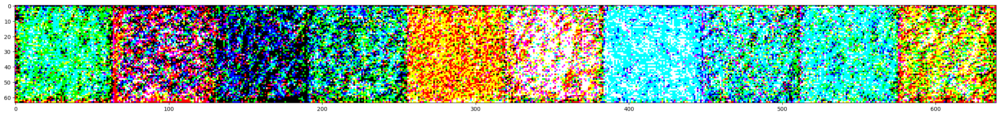

100%|██████████| 19/19 [00:43<00:00,  2.28s/it, MSE=0.0478]
999it [02:22,  6.99it/s]
999it [02:23,  6.97it/s]


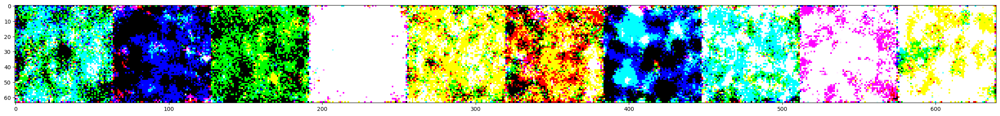

100%|██████████| 19/19 [00:43<00:00,  2.28s/it, MSE=0.0336]
999it [02:21,  7.04it/s]
999it [02:23,  6.98it/s]


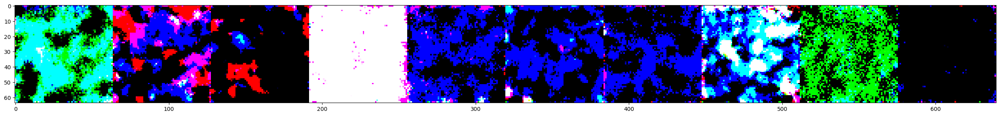

100%|██████████| 19/19 [00:43<00:00,  2.29s/it, MSE=0.0751]
999it [02:20,  7.10it/s]
999it [02:19,  7.15it/s]


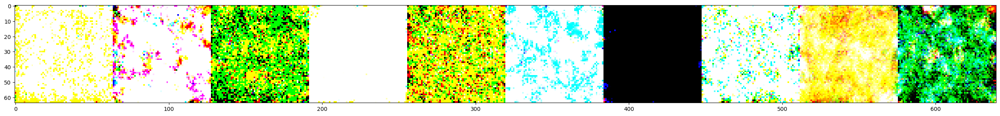

100%|██████████| 19/19 [00:42<00:00,  2.25s/it, MSE=0.013]
999it [02:17,  7.27it/s]
999it [02:18,  7.19it/s]


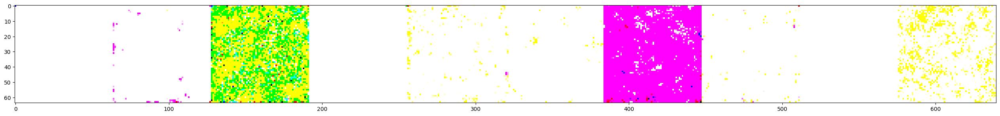

100%|██████████| 19/19 [00:42<00:00,  2.24s/it, MSE=0.0161]
999it [02:15,  7.35it/s]
999it [02:18,  7.22it/s]


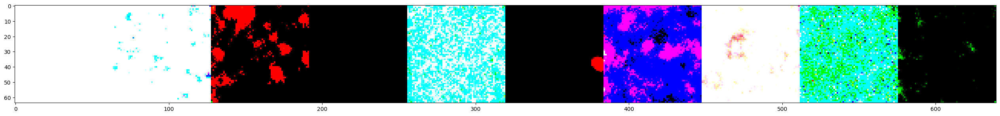

100%|██████████| 19/19 [00:42<00:00,  2.23s/it, MSE=0.209]
999it [02:15,  7.38it/s]
999it [02:15,  7.40it/s]


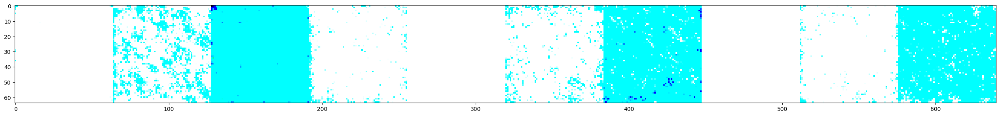

100%|██████████| 19/19 [00:42<00:00,  2.24s/it, MSE=0.00728]
999it [02:15,  7.37it/s]
999it [02:15,  7.36it/s]


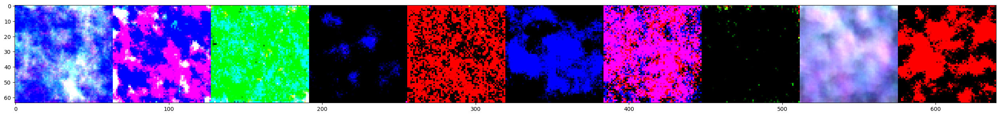

100%|██████████| 19/19 [00:42<00:00,  2.25s/it, MSE=0.00646]
999it [02:18,  7.24it/s]
999it [02:17,  7.28it/s]


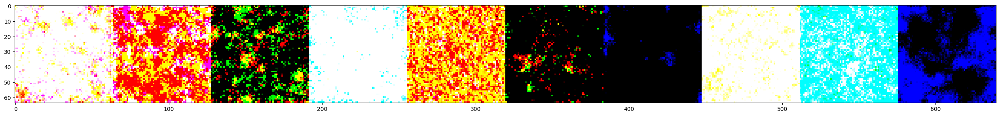

100%|██████████| 19/19 [00:42<00:00,  2.25s/it, MSE=0.054]
999it [02:17,  7.26it/s]
999it [02:16,  7.31it/s]


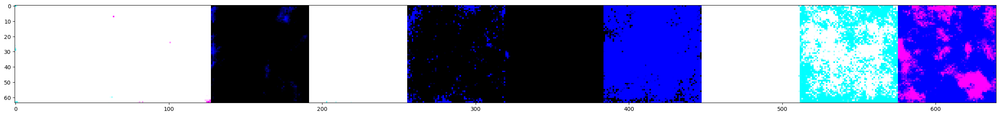

100%|██████████| 19/19 [00:42<00:00,  2.25s/it, MSE=0.00438]
999it [02:15,  7.37it/s]
999it [02:09,  7.71it/s]


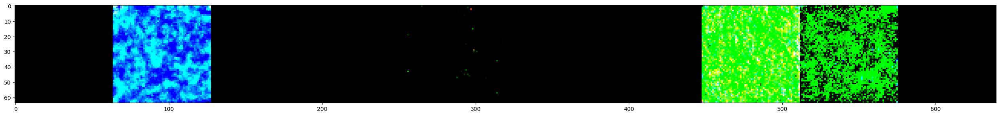

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.00538]
999it [02:11,  7.61it/s]
999it [02:11,  7.61it/s]


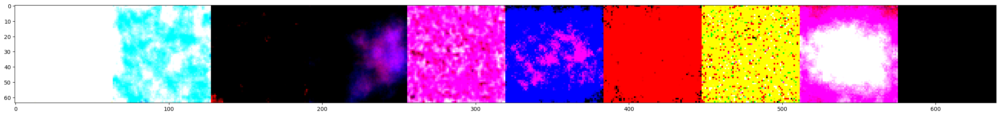

100%|██████████| 19/19 [00:43<00:00,  2.28s/it, MSE=0.0537]
999it [02:27,  6.75it/s]
999it [02:24,  6.92it/s]


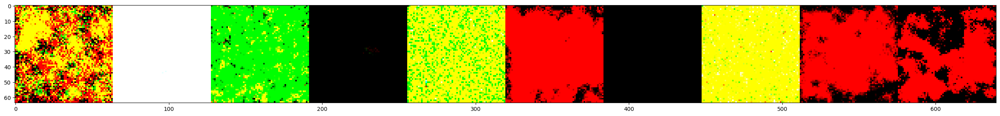

100%|██████████| 19/19 [00:43<00:00,  2.28s/it, MSE=0.023]
999it [02:17,  7.25it/s]
999it [02:20,  7.13it/s]


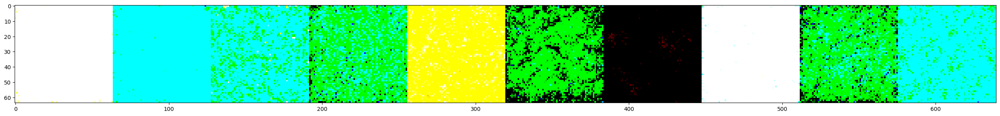

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.00481]
999it [02:09,  7.71it/s]
999it [02:12,  7.54it/s]


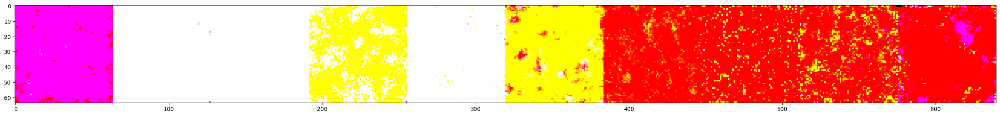

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.0448]
999it [02:16,  7.30it/s]
999it [02:17,  7.25it/s]


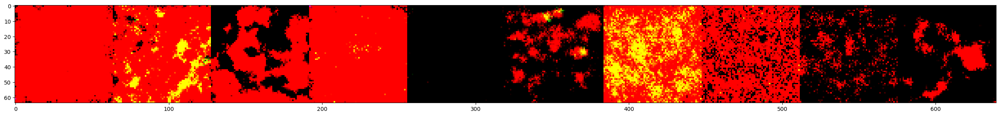

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.00336]
999it [02:14,  7.45it/s]
999it [02:15,  7.38it/s]


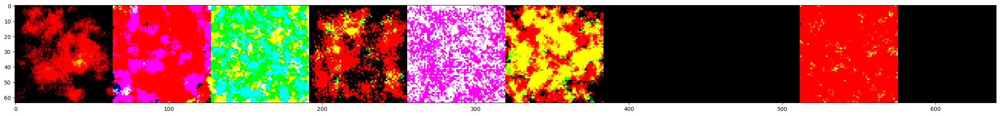

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.0144]
999it [02:16,  7.32it/s]
999it [02:22,  7.03it/s]


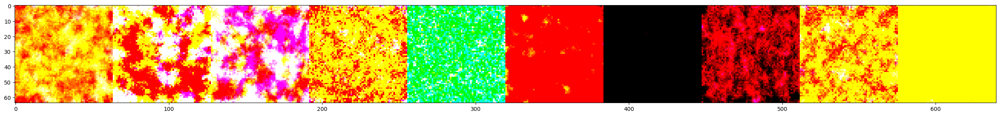

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.00305]
999it [02:16,  7.31it/s]
999it [02:18,  7.23it/s]


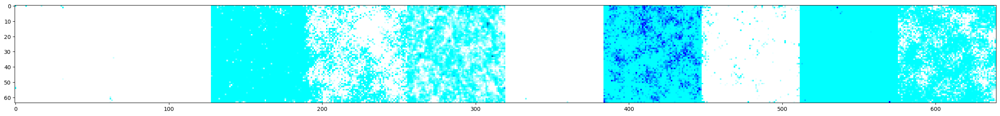

100%|██████████| 19/19 [00:43<00:00,  2.28s/it, MSE=0.0101]
999it [02:24,  6.92it/s]
999it [02:30,  6.62it/s]


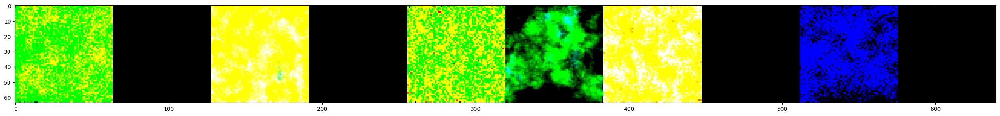

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.0273]
999it [02:23,  6.98it/s]
999it [02:26,  6.84it/s]


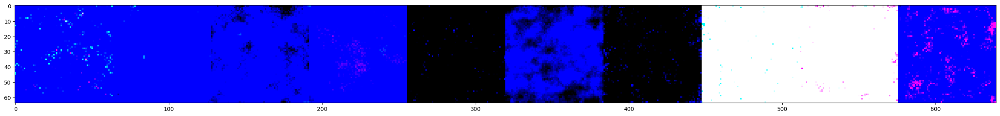

100%|██████████| 19/19 [00:42<00:00,  2.25s/it, MSE=0.0268]
999it [02:12,  7.54it/s]
999it [02:16,  7.30it/s]


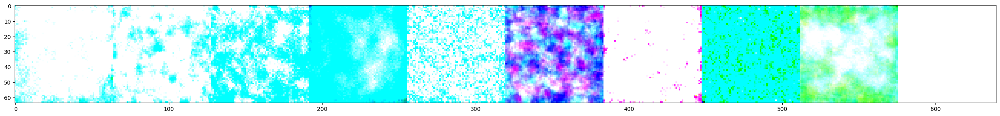

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.0308]
999it [02:16,  7.34it/s]
999it [02:17,  7.28it/s]


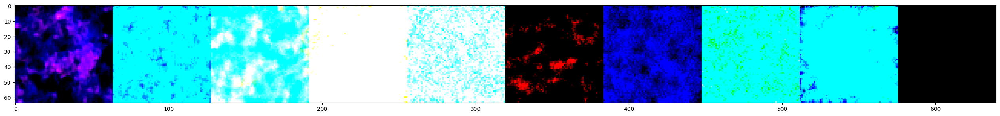

100%|██████████| 19/19 [00:43<00:00,  2.26s/it, MSE=0.0156]
999it [02:18,  7.23it/s]
999it [02:17,  7.25it/s]


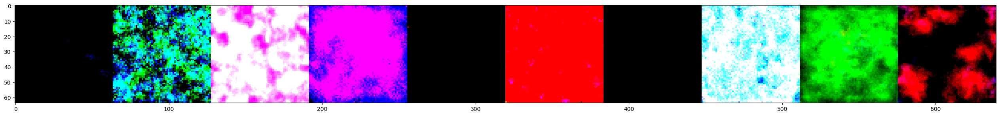

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.0383]
999it [02:17,  7.26it/s]
999it [02:16,  7.32it/s]


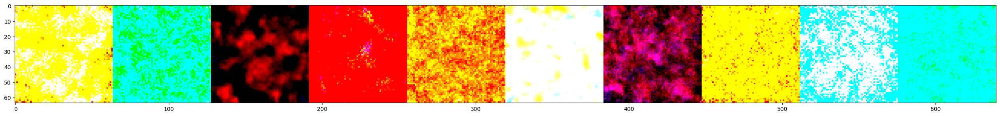

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.0874]
999it [02:15,  7.35it/s]
999it [02:17,  7.24it/s]


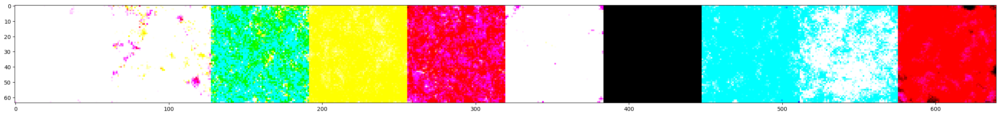

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.295]
999it [02:17,  7.27it/s]
999it [02:16,  7.32it/s]


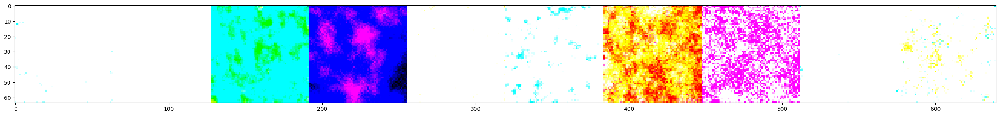

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.334]
999it [02:17,  7.29it/s]
999it [02:16,  7.30it/s]


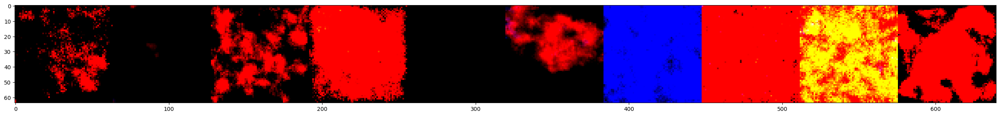

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.0233]
999it [02:18,  7.21it/s]
999it [02:19,  7.18it/s]


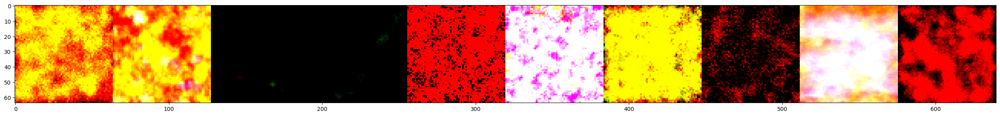

100%|██████████| 19/19 [00:43<00:00,  2.27s/it, MSE=0.0246]
999it [02:16,  7.30it/s]
999it [02:17,  7.24it/s]


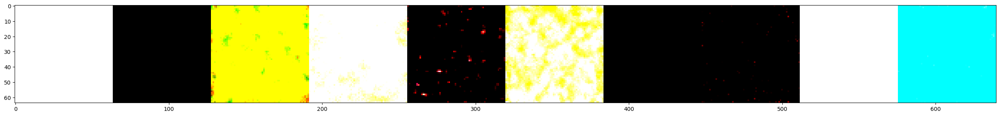

100%|██████████| 19/19 [00:42<00:00,  2.26s/it, MSE=0.00734]


In [ ]:
def launch():
    import argparse
    args = argparse.Namespace()
    args.run_name = "DDPM_conditional"
    args.epochs = 300
    args.batch_size = 14
    args.image_size = 64
    args.num_classes = 13
    args.dataset_path = "/content/Pattern"  # Update with the correct path
    args.device = "cuda"
    args.lr = 3e-4
    train(args)

if __name__ == '__main__':
    launch()

# Running Model

999it [00:39, 25.44it/s]


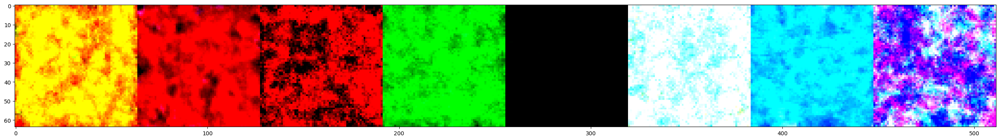

In [ ]:
device = "cuda"
model = UNet_conditional(num_classes=13).to(device)
ckpt = torch.load("./models/DDPM_conditional/ckpt.pt")
model.load_state_dict(ckpt)
diffusion = Diffusion(img_size=64, device=device)
n = 8
y = torch.Tensor([2] * n).long().to(device)
x = diffusion.sample(model, n, y, cfg_scale=0)
plot_images(x)

999it [00:16, 58.81it/s]


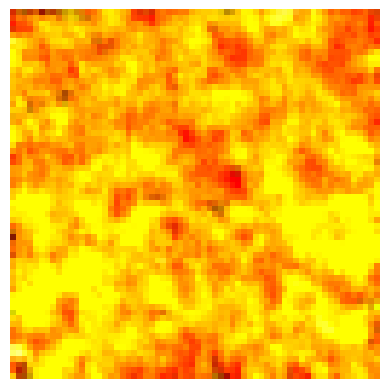

In [ ]:
device = "cuda"
model = UNet_conditional(num_classes=13).to(device)
ckpt = torch.load("./models/DDPM_conditional/ckpt.pt")
model.load_state_dict(ckpt)
diffusion = Diffusion(img_size=64, device=device)
n = 1
y = torch.Tensor([1] * n).long().to(device)
x = diffusion.sample(model, n, y, cfg_scale=0)

# Your tensor is on CUDA and you need to move it to CPU for plotting
x_cpu = x.cpu()

# Detach the tensor from its computation graph
x_cpu = x_cpu.detach()

# Convert the tensor to a numpy array
x_np = x_cpu.numpy()

# Remove the batch dimension (if any)
x_np = x_np.squeeze(0)

# Transpose the dimensions if the tensor is 3D (channels x height x width)
if len(x_np.shape) == 3:
    x_np = x_np.transpose((1, 2, 0))

# Plot the image
plt.imshow(x_np, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
print(x)

tensor([[[[104,  71,  83,  ...,  60, 139, 142],
          [148,  90, 102,  ...,  59, 108,  99],
          [127, 139, 126,  ...,  38,  46, 125],
          ...,
          [ 13,  22,  85,  ..., 189, 173, 255],
          [ 22,  58, 144,  ..., 207, 175, 228],
          [ 82, 134, 169,  ..., 151, 229, 213]],

         [[ 28, 131, 255,  ..., 225, 225, 116],
          [170, 170, 255,  ..., 175, 205, 167],
          [200, 173, 255,  ..., 187, 166, 198],
          ...,
          [128,  56, 177,  ..., 255, 255, 255],
          [146,  97, 152,  ..., 255, 255, 255],
          [160, 171, 192,  ..., 255, 255, 255]],

         [[  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          ...,
          [  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0]]]], device='cuda:0',
       dtype=torch.uint8)


# Neural Style Transfer

Fast Style Transfer:
https://www.tensorflow.org/hub/tutorials/tf2_arbitrary_image_stylization

# Importing Models & Libraries

In [ ]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.config.list_physical_devices('GPU'))

TF Version:  2.12.0
TF Hub version:  0.14.0
Eager mode enabled:  True
GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
torch.cuda.empty_cache()
!nvidia-smi

Fri Sep 22 12:43:54 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.07             Driver Version: 537.34       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 Ti     On  | 00000000:09:00.0  On |                  N/A |
| 58%   65C    P2             121W / 350W |   2520MiB / 12288MiB |      2%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Load TF Hub module.

hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

In [ ]:
# @title Define image loading and visualization functions  { display-mode: "form" }
from PIL import Image

def crop_center(image):
  """Returns a cropped square image."""
  shape = image.shape
  new_shape = min(shape[1], shape[2])
  offset_y = max(shape[1] - shape[2], 0) // 2
  offset_x = max(shape[2] - shape[1], 0) // 2
  image = tf.image.crop_to_bounding_box(
      image, offset_y, offset_x, new_shape, new_shape)
  return image

def resize_image_to_square(image_np, image_size=(256,256), preserve_aspect_ratio=True):
    image_np_extra = image_np.astype(np.float32)[np.newaxis, ...]
    if image_np_extra.max() > 1.0:
        image_np_extra = image_np_extra / 255.
    if len(image_np_extra.shape) == 3:
      image_np_extra = tf.stack([image_np_extra, image_np_extra, image_np_extra], axis=-1)
    image_np_extra = crop_center(image_np_extra)
    image_np_extra = tf.image.resize(image_np_extra, image_size, preserve_aspect_ratio=True)
    return image_np_extra

@functools.lru_cache(maxsize=None)
def load_image(image_url, image_size=(256, 256), preserve_aspect_ratio=True):
  """Loads and preprocesses images."""
  # Cache image file locally.
  image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)
  # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
  img = plt.imread(image_path).astype(np.float32)[np.newaxis, ...]
  if img.max() > 1.0:
    img = img / 255.
  if len(img.shape) == 3:
    img = tf.stack([img, img, img], axis=-1)
  img = crop_center(img)
  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

def load_local(image_path, image_size=(256, 256), preserve_aspect_ratio=True):
    """Loads and preprocesses images from a local file path."""
    # Load the image from the provided local file path.
    img = Image.open(image_path).convert("RGB")
    img = np.array(img).astype(np.float32)[np.newaxis, ...]

    # Normalize the image to the range [0, 1].
    img /= 255.0

    # Perform any additional preprocessing steps, like cropping and resizing.
    img = crop_center(img)
    img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)

    return img

def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w  * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()

# Tensor to Image Conversion

In [ ]:
print(x)
print(x.shape)

tensor([[[[214, 206, 170,  ..., 255, 234, 220],
          [244, 255, 245,  ..., 255, 255, 239],
          [255, 255, 255,  ..., 255, 255, 255],
          ...,
          [255, 210, 181,  ..., 255, 255, 255],
          [255, 184, 189,  ..., 255, 255, 255],
          [255, 184, 170,  ..., 255, 255, 255]],

         [[ 44,  98,  89,  ..., 101,  69,  65],
          [ 64, 118, 108,  ...,  96,  36,  63],
          [ 29,  78,  83,  ..., 105,  30,  88],
          ...,
          [ 89,  72,  76,  ..., 157, 140, 161],
          [ 95,  31,  68,  ..., 205, 141, 145],
          [198,  67,  77,  ..., 226, 154, 138]],

         [[  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          ...,
          [  0,   0,   0,  ...,   0,   0,   0],
          [  0,   0,   0,  ...,   0,   0,   0],
          [  5,   0,   0,  ...,   0,   0,   0]]]], device='cuda:0',
       dtype=torch.uint8)
torch.Size([1, 3, 64, 64])


In [ ]:
from PIL import Image
import numpy as np

# Convert the tensor to a NumPy array
image_array = x.cpu().numpy().squeeze().transpose((1, 2, 0))  # Convert shape (1, 3, 64, 64) to (64, 64, 3)

# Create a PIL Image from the NumPy array
image = Image.fromarray(image_array)  # No need to scale or convert dtype

# Save the image as a PNG file
image.save("output_image.png")

# Loading Style & Content Images

In [ ]:
# @title Load example images  { display-mode: "form" }

content_image_url = 'https://mosqpedia.org/img/cache/largeimage/jP9ZyXLR7oWWvZmRmbUpmCLt0eQhTDAMnj7UwODf' #@param {type: "string"}
# style_image_url = 'https://shomver.files.wordpress.com/2013/09/32.jpg' #@param {type: "string"}
output_image_size = 512  # @param {type:"integer"}

# The content image size can be arbitrary.
content_img_size = (output_image_size, output_image_size)
# The style prediction model was trained with image size 256 and it's the
# recommended image size for the style image (though, other sizes work as
# well but will lead to different results).

style_img_size = (64, 64)  # Recommended to keep it at 256.
content_img_size = (1024, 1024)

In [ ]:
content_image_RGBA = load_image(content_image_url, content_img_size)
content_image = content_image_RGBA[..., :3]

style_image_path = "/content/output_image.png"
style_image = load_local(style_image_path, style_img_size)

stylized_image = hub_module(tf.constant(content_image),
                            tf.constant(style_image))[0]

   8192/Unknown - 0s 0us/step

# Displaying Style Transfer

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact
from IPython.display import display

# Assuming you have content_image and stylized_image defined

def update_and_show(alpha):
    blended_image = (1 - alpha) * content_image + alpha * stylized_image
    show_n([content_image, style_image, blended_image], titles=['Original content image', 'Style image', 'Stylized image'])

# Use the @interact decorator to link the slider with the update_and_show function
@interact(alpha=(0, 1, 0.05))
def show_blended_images(alpha=0.5):
    update_and_show(alpha)

interactive(children=(FloatSlider(value=0.5, description='alpha', max=1.0, step=0.05), Output()), _dom_classes…

# Webcam Capture

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
import cv2
from google.colab.patches import cv2_imshow

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

# Style transfer function (replace with your implementation)
def style_transfer(frame):
    frame_size=512
    image_rgb_np = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    #print(image_rgb_np)
    resized_image_np = resize_image_to_square(image_rgb_np, image_size=(frame_size,frame_size))

    outputs = hub_module(tf.constant(resized_image_np), tf.constant(style_image))
    stylized_image = outputs[0]
    image_pil = tf.keras.preprocessing.image.array_to_img(stylized_image[0])

    image_bgr_np=cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)

    alpha = 1
    resized_frame = cv2.resize(frame, (frame_size, frame_size))
    blended_image = (1 - alpha) * resized_frame + alpha * image_bgr_np

    return blended_image

try:
    while True:
        # Capture frame from webcam
        frame_filename = take_photo()
        frame = cv2.imread(frame_filename)

        # Apply style transfer to the captured frame
        stylized_frame = style_transfer(frame)

        # Display the stylized frame using cv2_imshow
        cv2_imshow(stylized_frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cv2.destroyAllWindows()

except Exception as err:
    print(str(err))